# NYC Apartment Search

_[Project prompt](https://docs.google.com/document/d/1BYVyFBDcTywdUlanH0ysfOrNWPgl7UkqXA7NeewTzxA/edit#heading=h.bpxu7uvknnbk)_

_This scaffolding notebook may be used to help setup your final project. It's **totally optional** whether you make use of this or not._

_If you do use this notebook, everything provided is optional as well - you may remove or add code as you wish._

_**All code below should be consider "pseudo-code" - not functional by itself, and only an idea of a possible approach.**_

## Setup

In [34]:
# All import statements needed for the project, for example:

import json
import pathlib
from requests.exceptions import ReadTimeout
import time
import geoalchemy2 as gdb
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import requests
import shapely
import sqlalchemy as db
from sodapy import Socrata
import glob
import psycopg2
from sqlalchemy import create_engine,text

from sqlalchemy.orm import declarative_base
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Point, Polygon



In [3]:
# Any constants you might need; some have been added for you

# Where data files will be read from/written to - this should already exist
DATA_DIR = pathlib.Path("data")
ZIPCODE_DATA_FILE = DATA_DIR / "nyc_zipcodes.shp"
ZILLOW_DATA_FILE = DATA_DIR / "zillow_rent_data.csv"

NYC_DATA_APP_TOKEN = "xX3rCbSDM4vF0QEfgh09b2ZWW"
BASE_NYC_DATA_URL = "https://data.cityofnewyork.us/"
NYC_DATA_311 = "erm2-nwe9.geojson"
NYC_DATA_TREES = "5rq2-4hqu.geojson"

DB_NAME = "IEOR4501-XL"

DB_USER = "postgres"
#DB_URL = f"postgres+psycopg2://{DB_USER}@localhost/{DB_NAME}"
DB_URL = f"postgresql://{DB_USER}@localhost/{DB_NAME}"
DB_SCHEMA_FILE = "schema.sql"

QUERY_DIR = pathlib.Path("queries")

# directory where DB queries for Part 3 will be saved
QUERY_DIR = pathlib.Path("queries")

In [4]:
# Make sure the QUERY_DIRECTORY exists
if not QUERY_DIR.exists():
    QUERY_DIR.mkdir()

## Part 1: Data Preprocessing

In [6]:
#downloading data from small chunks
def download_nyc_csv_data(year,starttime,endtime,url,filename):
    filepath = f'{DATA_DIR}/{filename}_{year}.csv'
    query=f"""
    select * 
    where created_date between {starttime} 
    and {endtime}
    """

    if not filename:
        print(f"Downloading {url} to {filename}...")
        client = Socrata( "data.cityofnewyork.us",
                  "xX3rCbSDM4vF0QEfgh09b2ZWW",
                  username="yirong263@gmail.com",
                  password="UTDYnmz*zn2u3g6",
                  timeout=60)
        max_retries = 5
        retry_wait = 10  # Initial wait time in seconds

        while max_retries > 0:
            try:    
            # Set initial parameters for the SoQL query
                limit = 1000000  # Example limit
                offset = 0  # Start at the beginning
                total_records = 100000000  # Example total number of records you wish to download
                current_record = 0
                while current_record < total_records:
                    # Adjust the query to include the limit and offset
                    results = client.get(f"{url}",query= query+ f" limit {limit} offset {offset}")
                    
                    # Convert to DataFrame and save to CSV
                    df = pd.DataFrame.from_records(results)
                    df.to_csv(f'{filepath}', index=False)
                    
                    # Update the offset and current_record count
                    offset += limit
                    current_record += len(results)

                    # Optional: Print progress
                    print(f'Downloaded {current_record} of {total_records}')
                break
            
            except ReadTimeout:
                # Wait before retrying
                time.sleep(retry_wait)
                # Reduce the number of retries left
                max_retries -= 1
                # Increase the wait time for the next retry
                retry_wait *= 2
        
        print(f"Done downloading {url} from {year}.")

    else:
        print(f"Reading from {filepath}...")


    return filepath

In [7]:
def load_and_clean_zipcodes(zipcode_datafile):
    """
    Load and clean NYC zipcode data from a shapefile.
    Args:
    zipcode_datafile (str): The file path to the shapefile.
    
    Returns:
    GeoDataFrame: Cleaned geospatial data frame of NYC zipcodes.
    """
    # Load the shapefile using GeoPandas
    gdf = gpd.read_file(zipcode_datafile)
    
    # Remove unnecessary columns from the dataframe
    columns_to_drop = ['BLDGZIP', 'STATE', 'ST_FIPS', 'CTY_FIPS', 'URL', 'SHAPE_AREA', 'SHAPE_LEN']
    gdf_cleaned = gdf.drop(columns=columns_to_drop)
    gdf.drop_duplicates(subset='ZIPCODE', keep='first', inplace=True)
    gdf.dropna(inplace=True)
    gdf.drop_duplicates(inplace=True)
    # Rename columns for clarity
    gdf_cleaned = gdf_cleaned.rename(columns={'PO_NAME': 'City'})
    # Set the coordinate reference system to EPSG 4326
    gdf_cleaned = gdf_cleaned.to_crs(epsg=4326)
    # Normalize column names
    gdf_cleaned.columns = [column_name.lower().replace(' ', '_') for column_name in gdf_cleaned.columns]
    gdf_cleaned['zipcode']=gdf_cleaned['zipcode'].astype(float).astype(int)
    gdf_cleaned['population']=gdf_cleaned['population'].astype(float).astype(int)

    return gdf_cleaned


In [8]:
def download_and_clean_311_data():
    #data downloading
    download_nyc_csv_data(2015,"2015-01-01T00:00:00.000","2015-12-31T23:59:59.999","erm2-nwe9",'nyc_311_data')
    download_nyc_csv_data(2016,"2016-01-01T00:00:00.000","2016-12-31T23:59:59.999","erm2-nwe9",'nyc_311_data')
    download_nyc_csv_data(2017,"2017-01-01T00:00:00.000","2017-12-31T23:59:59.999","erm2-nwe9",'nyc_311_data')
    download_nyc_csv_data(2018,"2018-01-01T00:00:00.000","2018-12-31T23:59:59.999","erm2-nwe9",'nyc_311_data')
    download_nyc_csv_data(2019,"2019-01-01T00:00:00.000","2019-12-31T23:59:59.999","erm2-nwe9",'nyc_311_data')
    download_nyc_csv_data(2020,"2020-01-01T00:00:00.000","2020-12-31T23:59:59.999","erm2-nwe9",'nyc_311_data')
    download_nyc_csv_data(2021,"2021-01-01T00:00:00.000","2021-12-31T23:59:59.999","erm2-nwe9",'nyc_311_data')
    download_nyc_csv_data(2022,"2022-01-01T00:00:00.000","2022-12-31T23:59:59.999","erm2-nwe9",'nyc_311_data')
    download_nyc_csv_data(2023,"2023-01-01T00:00:00.000","2015-09-30T23:59:59.999","erm2-nwe9",'nyc_311_data')

    # After downloading all chunks
    csv_files = glob.glob('data/nyc_311_data_*.csv')
    # Remove unnecessary columns by keeping only the ones you need for each file
    dfs=[]
    for file in csv_files:
        df=pd.read_csv(file)
        columns_needed = ['unique_key', 'created_date', 'complaint_type','incident_zip','latitude', 'longitude']  # Replace with actual column names
        df = df[columns_needed]
        #eliminate duplicate
        df.drop_duplicates(inplace=True)
        # Remove invalid data points
        # This is highly dependent on the context of your data, but as an example:
        df.dropna(inplace=True) 
        # Normalize column names
        df.columns = [column_name.lower().replace(' ', '_') for column_name in df.columns]
        dfs.append(df) # processed df and append to a list

    # Concatenate all DataFrames into one
    NYC311_df = pd.concat(dfs,ignore_index=True)
    NYC311_df.drop_duplicates(inplace=True)# header duplicate elimination
    NYC311_df = NYC311_df.drop_duplicates(subset=['unique_key'])
    # Normalize Column Types

    # unique_key 
    NYC311_df['unique_key'] = NYC311_df['unique_key'].astype(int)
    # change name into 'id_NYC311'
    NYC311_df.rename(columns={'unique_key': 'id_NYC311'}, inplace=True)

    #incident zip
    #rename from incident_zip to zipcode
    NYC311_df.rename(columns={'incident_zip': 'zipcode'}, inplace=True)
  
    NYC311_df['zipcode']=NYC311_df['zipcode'].astype(float).astype(int)
    NYC311_df = NYC311_df[NYC311_df['zipcode'].apply(lambda x: str(x).isdigit() and len(str(x)) == 5)] 

    #created_date
    #rename "date"
    NYC311_df.rename(columns={'created_date': 'date'}, inplace=True)
    # sorting by date
    NYC311_df = NYC311_df.sort_values(by='date')
    #change date format into yyyy-mm-dd
    NYC311_df['date'] = pd.to_datetime(NYC311_df['date']).dt.strftime('%Y-%m-%d')
        
    # Assuming df is your existing DataFrame with latitude and longitude columns
    NYC311_df = gpd.GeoDataFrame(NYC311_df, geometry=gpd.points_from_xy(NYC311_df['longitude'], NYC311_df['latitude']))
    NYC311_df.set_crs(epsg=4326, inplace=True)


    #save the combined DataFrame to a new CSV file
    # NYC311_df.to_csv('data/nyc_311_data.csv', index=False)
    return NYC311_df
    

In [9]:
def download_and_clean_tree_data():
    download_nyc_csv_data(2015,"2015-01-01T00:00:00.000","2015-12-31T23:59:59.999","5rq2-4hqu",'tree')
    tree_df=pd.read_csv('data/tree_2015.csv')
    # Remove unnecessary columns by keeping only the ones you need
    columns_needed = ['created_at', 'tree_id', 'status','zipcode','health','spc_common', 'latitude', 'longitude']  # Replace with actual column names
    tree_df = tree_df[columns_needed]

    # Remove invalid data points
    # This is highly dependent on the context of your data, but as an example:
    tree_df.drop_duplicates(inplace=True)
    tree_df.dropna(inplace=True)  

    # Normalize column names
    tree_df.columns = [column_name.lower().replace(' ', '_') for column_name in tree_df.columns]
    #created_at
    tree_df.rename(columns={'created_at': 'date'}, inplace=True)
    tree_df['date'] = pd.to_datetime(tree_df['date']).dt.strftime('%Y-%m-%d')#change date format into yyyy-mm-dd

    #zipcode
    tree_df['zipcode'] = tree_df['zipcode'].astype(int)
    tree_df=tree_df.sort_values('date')

    tree_df = gpd.GeoDataFrame(tree_df, geometry=gpd.points_from_xy(tree_df['longitude'], tree_df['latitude']))
    tree_df.set_crs(epsg=4326, inplace=True)
    return tree_df


In [11]:
def load_and_clean_zillow_data():
    """
    Load and clean Zillow rent data from a CSV file, and transform it to a long format.
    
    Returns:
    DataFrame: Cleaned and transformed data frame of Zillow rent data.
    """
    # Load the CSV data using Pandas
    zillow_data_path = DATA_DIR / "zillow_rent_data.csv"
    df = pd.read_csv(zillow_data_path)
    
    # Keep only necessary columns
    columns_to_keep = ['RegionName', 'State', 'City', 'Metro', 'CountyName'] + [col for col in df.columns if '-' in col]
    df_cleaned = df[columns_to_keep]
    
    # Remove rows with a significant number of missing values
    df_cleaned = df_cleaned.dropna(thresh=len(df_cleaned.columns)/2, axis=0)

    # Filter for rows where the State is 'NY'
    df_cleaned = df_cleaned[df_cleaned['State'] == 'NY']
    
    # Rename columns for clarity
    df_cleaned = df_cleaned.rename(columns={'RegionName': 'ZipCode'})

    # Convert the data from wide format to long format
    # Melt the DataFrame to have Date and Rent as separate columns
    date_columns = [col for col in df_cleaned.columns if '-' in col]
    df_cleaned = df_cleaned.melt(id_vars=['ZipCode', 'State', 'City', 'Metro', 'CountyName'],
                                     value_vars=date_columns,
                                     var_name='Date',
                                     value_name='Rent')
    df_cleaned['ZipCode']=df_cleaned['ZipCode'].astype(float).astype(int)
    # Normalize column names
    df_cleaned.columns = [column_name.lower().replace(' ', '_') for column_name in df_cleaned.columns]
    
    return df_cleaned

In [12]:
def load_all_data():
    geodf_zipcode_data = load_and_clean_zipcodes(ZIPCODE_DATA_FILE)
    geodf_311_data = download_and_clean_311_data()
    geodf_tree_data = download_and_clean_tree_data()
    df_zillow_data = load_and_clean_zillow_data()
    return (
        geodf_zipcode_data,
        geodf_311_data,
        geodf_tree_data,
        df_zillow_data
    )

In [13]:
geodf_zipcode_data, geodf_311_data, geodf_tree_data, df_zillow_data = load_all_data()

Reading from data/nyc_311_data_2015.csv...
Reading from data/nyc_311_data_2016.csv...
Reading from data/nyc_311_data_2017.csv...
Reading from data/nyc_311_data_2018.csv...
Reading from data/nyc_311_data_2019.csv...
Reading from data/nyc_311_data_2020.csv...
Reading from data/nyc_311_data_2021.csv...
Reading from data/nyc_311_data_2022.csv...
Reading from data/nyc_311_data_2023.csv...


/var/folders/xd/5kjy8s3j1_x54cfm18mcsxg40000gn/T/ipykernel_97946/883424399.py:18: DtypeWarning: Columns (8,39,40) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv(file)
/var/folders/xd/5kjy8s3j1_x54cfm18mcsxg40000gn/T/ipykernel_97946/883424399.py:18: DtypeWarning: Columns (8,38,39,40) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv(file)
/var/folders/xd/5kjy8s3j1_x54cfm18mcsxg40000gn/T/ipykernel_97946/883424399.py:18: DtypeWarning: Columns (8,33,34,35,36,37,39,40) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv(file)
/var/folders/xd/5kjy8s3j1_x54cfm18mcsxg40000gn/T/ipykernel_97946/883424399.py:18: DtypeWarning: Columns (8,34,40) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv(file)
/var/folders/xd/5kjy8s3j1_x54cfm18mcsxg40000gn/T/ipykernel_97946/883424399.py:18: DtypeWarning: Columns (38,39,40) have mixed types. Speci

Reading from data/tree_2015.csv...


In [14]:
# Show basic info about each dataframe
geodf_zipcode_data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 263 entries, 0 to 262
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   zipcode     263 non-null    int64   
 1   city        263 non-null    object  
 2   population  263 non-null    int64   
 3   area        263 non-null    float64 
 4   county      263 non-null    object  
 5   geometry    263 non-null    geometry
dtypes: float64(1), geometry(1), int64(2), object(2)
memory usage: 12.5+ KB


In [15]:
# Show first 5 entries about each dataframe
geodf_zipcode_data.head()

,zipcode,city,population,area,county,geometry
0,11436,Jamaica,18681,2.269930e+07,Queens,"POLYGON ((-73.80585 40.68291, -73.80569 40.682..."
1,11213,Brooklyn,62426,2.963100e+07,Kings,"POLYGON ((-73.93740 40.67973, -73.93487 40.679..."
2,11212,Brooklyn,83866,4.197210e+07,Kings,"POLYGON ((-73.90294 40.67084, -73.90223 40.668..."
3,11225,Brooklyn,56527,2.369863e+07,Kings,"POLYGON ((-73.95797 40.67066, -73.95576 40.670..."
4,11218,Brooklyn,72280,3.686880e+07,Kings,"POLYGON ((-73.97208 40.65060, -73.97192 40.650..."


In [16]:
geodf_311_data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 23030426 entries, 291587 to 16420015
Data columns (total 7 columns):
 #   Column          Dtype   
---  ------          -----   
 0   id_NYC311       int64   
 1   date            object  
 2   complaint_type  object  
 3   zipcode         int64   
 4   latitude        float64 
 5   longitude       float64 
 6   geometry        geometry
dtypes: float64(2), geometry(1), int64(2), object(2)
memory usage: 1.4+ GB


In [17]:
geodf_311_data.head()

,id_NYC311,date,complaint_type,zipcode,latitude,longitude,geometry
291587,29616011,2015-01-01,HEAT/HOT WATER,11207,40.667093,-73.891719,POINT (-73.89172 40.66709)
291738,29615514,2015-01-01,HEAT/HOT WATER,10034,40.868366,-73.916422,POINT (-73.91642 40.86837)
291739,29615513,2015-01-01,HEAT/HOT WATER,11377,40.744999,-73.892968,POINT (-73.89297 40.74500)
291740,29615512,2015-01-01,HEAT/HOT WATER,10472,40.833156,-73.870540,POINT (-73.87054 40.83316)
291741,29615511,2015-01-01,HEAT/HOT WATER,10024,40.787862,-73.976899,POINT (-73.97690 40.78786)


In [18]:
geodf_tree_data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 189969 entries, 13800 to 196344
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype   
---  ------      --------------   -----   
 0   date        189969 non-null  object  
 1   tree_id     189969 non-null  int64   
 2   status      189969 non-null  object  
 3   zipcode     189969 non-null  int64   
 4   health      189969 non-null  object  
 5   spc_common  189969 non-null  object  
 6   latitude    189969 non-null  float64 
 7   longitude   189969 non-null  float64 
 8   geometry    189969 non-null  geometry
dtypes: float64(2), geometry(1), int64(2), object(4)
memory usage: 14.5+ MB


In [19]:
geodf_tree_data.head()

,date,tree_id,status,zipcode,health,spc_common,latitude,longitude,geometry
13800,2015-05-19,347,Alive,10459,Fair,American hornbeam,40.821445,-73.892916,POINT (-73.89292 40.82144)
45386,2015-05-19,317,Alive,10459,Fair,Amur maackia,40.825308,-73.897495,POINT (-73.89750 40.82531)
1890,2015-05-19,306,Alive,10459,Good,Siberian elm,40.823933,-73.897177,POINT (-73.89718 40.82393)
22732,2015-05-19,9,Alive,10474,Poor,silver birch,40.814107,-73.889021,POINT (-73.88902 40.81411)
4301,2015-05-19,307,Alive,10459,Good,Siberian elm,40.824059,-73.897260,POINT (-73.89726 40.82406)


In [20]:
df_zillow_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9660 entries, 0 to 9659
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   zipcode     9660 non-null   int64  
 1   state       9660 non-null   object 
 2   city        9660 non-null   object 
 3   metro       9660 non-null   object 
 4   countyname  9660 non-null   object 
 5   date        9660 non-null   object 
 6   rent        8716 non-null   float64
dtypes: float64(1), int64(1), object(5)
memory usage: 528.4+ KB


In [21]:
df_zillow_data.head()

,zipcode,state,city,metro,countyname,date,rent
0,11385,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Queens County,2015-01-31,NaN
1,10467,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Bronx County,2015-01-31,NaN
2,11226,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Kings County,2015-01-31,1944.609891
3,11207,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Kings County,2015-01-31,NaN
4,10025,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",New York County,2015-01-31,3068.951823


## Part 2: Storing Data

### Creating Tables


These are just a couple of options to creating your tables; you can use one or the other, a different method, or a combination.

#### Option 2: SQLAlchemy

In [22]:
Base = declarative_base()

from sqlalchemy import create_engine, Column, Integer, String, Float, Date, MetaData, Table
from geoalchemy2 import Geometry
from sqlalchemy.ext.declarative import declarative_base
from sqlalchemy.schema import PrimaryKeyConstraint

class ZipcodeArea(Base):
    __tablename__ = 'zipcode_areas'  # Replace with your actual table name
    # Assuming 'zipcode' is a unique identifier for each row
    zipcode = Column(Integer, primary_key=True)
    city = Column(String)
    population = Column(Integer)
    area = Column(Float)
    county = Column(String)
    geometry = Column(Geometry('POLYGON', srid=4326))  # Adjust the geometry type if needed

class NYC311Complaints(Base):
    __tablename__ = 'nyc311_complaints'
    id_NYC311 = Column(Integer, primary_key=True)
    date = Column(Date)
    complaint_type = Column(String)
    zipcode = Column(Integer)
    latitude = Column(Float)
    longitude = Column(Float)
    geometry = Column(Geometry(geometry_type='POINT', srid=4326))

class Tree(Base):
    __tablename__ = 'trees'
    tree_id = Column(Integer, primary_key=True)
    date = Column(Date)
    status = Column(String)
    zipcode = Column(Integer)
    health = Column(String)
    spc_common = Column(String)
    latitude = Column(Float)
    longitude = Column(Float)
    geometry = Column(Geometry(geometry_type='POINT', srid=4326))

class Rent(Base):
    __tablename__ = 'rents'
    id=Column(Integer, primary_key=True)
    zipcode = Column(Integer)
    state = Column(String)
    city = Column(String)
    metro = Column(String)
    countyname = Column(String)
    date = Column(Date)
    rent = Column(Float)
    
engine = create_engine(DB_URL)
Base.metadata.create_all(engine)



### Add Data to Database

These are just a couple of options to write data to your tables; you can use one or the other, a different method, or a combination.

Add ZipCode Data to Database

In [21]:
Session = db.orm.sessionmaker(bind=engine)
session = Session()

In [22]:

from shapely import wkt
from sqlalchemy.dialects.postgresql import insert

geodf_zipcode_data['geometry'] = geodf_zipcode_data['geometry'].apply(lambda geom: geom.wkt)
for index, row in geodf_zipcode_data.iterrows():
    insert_stmt = insert(ZipcodeArea).values(
        zipcode=row['zipcode'],
        city=row['city'],
        population=row['population'],
        area=row['area'],
        county=row['county'],
        geometry=row['geometry']
    )
    on_conflict_stmt = insert_stmt.on_conflict_do_update(
        index_elements=['zipcode'],  # Unique constraint or column(s) causing conflict
        set_=dict(
            city=row['city'],
            population=row['population'],
            area=row['area'],
            county=row['county'],
            geometry=row['geometry']
        )
    )
    session.execute(on_conflict_stmt)


/var/folders/xd/5kjy8s3j1_x54cfm18mcsxg40000gn/T/ipykernel_87695/1732785940.py:4: UserWarning: Geometry column does not contain geometry.
  geodf_zipcode_data['geometry'] = geodf_zipcode_data['geometry'].apply(lambda geom: geom.wkt)


In [23]:
session.commit()

Add NYC 311 Complaint Data to Database

In [24]:
from sqlalchemy.dialects.postgresql import insert
# Convert geometry column to WKT format
geodf_311_data['geometry'] = geodf_311_data['geometry'].apply(lambda geom: geom.wkt)

def insert_batch(session, model, data, batch_size=300000):
    for i in range(0, len(data), batch_size):
        batch = data.iloc[i:i+batch_size].to_dict(orient='records')

        for record in batch:
            stmt = insert(model).values(record)
            do_nothing_stmt = stmt.on_conflict_do_nothing(index_elements=['id_NYC311'])
            session.execute(do_nothing_stmt)

        session.commit()

# Insert data in batches
insert_batch(session, NYC311Complaints, geodf_311_data)n


/var/folders/xd/5kjy8s3j1_x54cfm18mcsxg40000gn/T/ipykernel_87695/3858810351.py:3: UserWarning: Geometry column does not contain geometry.
  geodf_311_data['geometry'] = geodf_311_data['geometry'].apply(lambda geom: geom.wkt)


In [25]:
session.commit()

Add Tree Data to Database

In [1]:
geodf_tree_data['geometry'] = geodf_tree_data['geometry'].apply(lambda geom: geom.wkt)

NameError: name 'geodf_tree_data' is not defined

In [119]:

for index, row in geodf_tree_data.iterrows():
    # Create a TreeData object for each row
    tree = Tree(
        tree_id=row['tree_id'],
        date=row['date'],
        status=row['status'],
        zipcode=row['zipcode'],
        health=row['health'],
        spc_common=row['spc_common'],
        latitude=row['latitude'],
        longitude=row['longitude'],
        geometry=row['geometry']
    )
    # Add each TreeData object to the session
    session.add(tree)

In [123]:
session.commit()

Add Zillow Rent Data to Database

In [127]:
from sqlalchemy import text

alter_statement = text("ALTER TABLE rents ADD COLUMN id SERIAL PRIMARY KEY;")
drop_constraint_statement = text("ALTER TABLE rents DROP CONSTRAINT rents_pkey;")

with engine.connect() as connection:
    connection.execute(drop_constraint_statement)
    connection.execute(alter_statement)


In [142]:
# Loop through each row in the DataFrame for Zillow rent data
for index, row in df_zillow_data.iterrows():
    # Create a ZillowRent object for each row (assuming ZillowRent is the model class)
    rent = Rent(
        zipcode=row['zipcode'],
        state=row['state'],
        city=row['city'],
        metro=row['metro'],
        countyname=row['countyname'],
        date=row['date'],
        rent=row['rent']
    )
    # Add each ZillowRent object to the session
    session.add(rent)

In [143]:
# Commit the session to save all added objects to the database
session.commit()

## Part 3: Understanding the Data

### Query 1

In [23]:
# Helper function to write the queries to file
def write_query_to_file(query, outfile):
    raise NotImplementedError()

In [24]:

from sqlalchemy.sql import text

# Define the directory where query files will be saved
# Creates the directory if it does not exist
QUERY_DIR = pathlib.Path("queries")
QUERY_DIR.mkdir(exist_ok=True)

# Define the SQL query for Query 1
# This query finds the number of 311 complaints per zip code 
# between 2022-10-01 and 2023-09-30 and orders them in descending order
QUERY_1 = """
SELECT zipcode, COUNT(*) AS complaint_count
FROM nyc311_complaints
WHERE date BETWEEN '2022-10-01' AND '2023-09-30'
GROUP BY zipcode
ORDER BY complaint_count DESC;
"""

# Function to write the SQL query to a file
def write_query_to_file(query, outfile):
    with open(outfile, 'w') as file:
        file.write(query)

# File path for saving the query
QUERY_1_FILENAME = QUERY_DIR / "complaints_per_zipcode.sql"

# Execute the query and print the results
with engine.connect() as conn:
    result = conn.execute(text(QUERY_1))
    for row in result:
        print(row)

# Write the query to a file
write_query_to_file(QUERY_1, QUERY_1_FILENAME)


(11226, 49279)
(10467, 47364)
(10468, 44045)
(10452, 43858)
(11385, 43587)
(10457, 41497)
(10458, 41152)
(11207, 39922)
(10456, 39756)
(11201, 39230)
(10453, 38065)
(11208, 36494)
(10031, 33798)
(11221, 33073)
(10466, 32515)
(10032, 31973)
(10025, 30935)
(10462, 30720)
(11238, 30114)
(11230, 29440)
(11368, 29235)
(11220, 28845)
(10019, 28113)
(11216, 28068)
(11225, 28030)
(11235, 27685)
(11212, 27233)
(10460, 26955)
(10463, 26954)
(10023, 26805)
(11203, 26749)
(11214, 26632)
(11377, 26222)
(10027, 25785)
(11101, 25752)
(11213, 25733)
(10002, 25553)
(11211, 25467)
(11206, 25334)
(10472, 25334)
(11234, 25282)
(11222, 25262)
(11209, 25145)
(11215, 25127)
(11218, 24989)
(11233, 24875)
(11223, 24058)
(11373, 23929)
(10033, 23654)
(11237, 23320)
(11229, 22655)
(11236, 22375)
(10461, 22256)
(10034, 22248)
(10011, 22088)
(11204, 21658)
(10003, 21570)
(10026, 21260)
(10469, 21187)
(10009, 20997)
(11210, 20924)
(10029, 20808)
(10451, 20695)
(10036, 20683)
(11372, 20405)
(10459, 20278)
(11217, 20

### Query 2

In [25]:
# Query 2: Finding the top 10 zip codes with the most trees
# This query aims to identify which 10 zip codes have the highest number of trees

QUERY_2 = """
SELECT zipcode, COUNT(*) AS tree_count
FROM trees
GROUP BY zipcode
ORDER BY tree_count DESC
LIMIT 10;
"""

# File path for saving the query
QUERY_2_FILENAME = QUERY_DIR / "top_10_zipcodes_by_trees.sql"

# Execute the query and print the results
with engine.connect() as conn:
    result = conn.execute(text(QUERY_2))
    for row in result:
        print(row)

# Write the query to a file
write_query_to_file(QUERY_2, QUERY_2_FILENAME)


(10309, 7839)
(10312, 6946)
(10469, 4703)
(11230, 4684)
(10314, 3964)
(10306, 3767)
(10465, 3461)
(11229, 3395)
(11375, 3324)
(10461, 3315)


### Query 3

In [26]:
# Query 3: Calculating average rent in the areas with the most trees for August 2023
# This query identifies the average rent by zip code for the top 10 zip codes with the most trees, 
# specifically for the month of August 2023

QUERY_3 = """
WITH TopTreeZipCodes AS (
    SELECT r.zipcode
    FROM trees
    JOIN rents r ON trees.zipcode = r.zipcode
    GROUP BY r.zipcode
    ORDER BY COUNT(*) DESC
    LIMIT 10
)
SELECT ttz.zipcode, ROUND(CAST(AVG(r.rent) AS numeric), 2) AS average_rent
FROM TopTreeZipCodes ttz
JOIN rents r ON ttz.zipcode = r.zipcode
WHERE r.date BETWEEN '2023-08-01' AND '2023-08-31'
GROUP BY ttz.zipcode
ORDER BY COUNT(*) DESC;
"""

# File path for saving the query
QUERY_3_FILENAME = QUERY_DIR / "average_rent_in_green_areas.sql"

# Execute the query and print the results
with engine.connect() as conn:
    result = conn.execute(text(QUERY_3))
    for row in result:
        print(row)

# Write the query to a file
write_query_to_file(QUERY_3, QUERY_3_FILENAME)

(10462, Decimal('2001.59'))
(10467, Decimal('2353.69'))
(11210, Decimal('2707.10'))
(11215, Decimal('3575.65'))
(11218, Decimal('2756.59'))
(11229, Decimal('2680.57'))
(11230, Decimal('2657.04'))
(11235, Decimal('2457.56'))
(11355, Decimal('2121.97'))
(11375, Decimal('2743.40'))


### Query 4

In [28]:
# Query 4: Correlation between area's rent, tree count, and number of 311 complaints
# This query finds the 5 zip codes with the lowest and highest average rent for January 2023,
# along with the tree count and complaint count for each zip code

QUERY_4 = """
WITH RentRanking AS (
    SELECT zipcode, ROUND(CAST(AVG(r.rent) AS numeric), 2) AS average_rent,
    RANK() OVER (ORDER BY AVG(rent)) AS rent_rank
    FROM rents r
    WHERE date BETWEEN '2023-01-01' AND '2023-01-31'
    GROUP BY zipcode
),
MaxRank AS (
    SELECT MAX(rent_rank) AS max_rank FROM RentRanking
)
SELECT rr.zipcode, rr.average_rent, 
       (SELECT COUNT(*) FROM trees WHERE zipcode = rr.zipcode) AS tree_count,
       (SELECT COUNT(*) FROM nyc311_complaints WHERE zipcode = rr.zipcode AND date BETWEEN '2023-01-01' AND '2023-01-31') AS complaint_count
FROM RentRanking rr, MaxRank
WHERE rr.rent_rank <= 5 OR rr.rent_rank >= (MaxRank.max_rank - 4)
ORDER BY rr.average_rent;
"""

# File path for saving the query
QUERY_4_FILENAME = QUERY_DIR / "rent_tree_complaint_correlation.sql"

# Execute the query and print the results
with engine.connect() as conn:
    result = conn.execute(text(QUERY_4))
    for row in result:
        print(row)

# Write the query to a file
write_query_to_file(QUERY_4, QUERY_4_FILENAME)


(14607, Decimal('1232.20'), 0, 0)
(14222, Decimal('1263.79'), 0, 0)
(12180, Decimal('1309.72'), 0, 0)
(12601, Decimal('1656.21'), 0, 0)
(10462, Decimal('1801.89'), 2056, 2360)
(10069, Decimal('4959.67'), 9, 36)
(10013, Decimal('5480.11'), 656, 762)
(10007, Decimal('7270.24'), 163, 232)
(11937, Decimal('32893.57'), 0, 0)
(11968, Decimal('38626.57'), 0, 0)


### Query 5

In [29]:
# Query 5: Identifying areas with the most greenery using spatial join
# This query rewrites Query 2 to include a spatial join between the trees table and the zipcodes table
# to determine which trees are located within the boundary of a zipcode

QUERY_5 = """
WITH TreeCount AS (
    SELECT z.zipcode, COUNT(t.tree_id) AS tree_count
    FROM zipcode_areas z
    JOIN trees t ON ST_Within(t.geometry, z.geometry)
    GROUP BY z.zipcode
)
SELECT zipcode, tree_count
FROM TreeCount
ORDER BY tree_count DESC
LIMIT 10;
"""

# File path for saving the query
QUERY_5_FILENAME = QUERY_DIR / "greenery_areas_with_spatial_join.sql"

# Execute the query and print the results
with engine.connect() as conn:
    result = conn.execute(text(QUERY_5))
    for row in result:
        print(row)

# Write the query to a file
write_query_to_file(QUERY_5, QUERY_5_FILENAME)


(10309, 7839)
(10312, 6946)
(10469, 4703)
(11230, 4684)
(10314, 3964)
(10306, 3767)
(10465, 3461)
(11229, 3395)
(11375, 3324)
(10461, 3315)


### Query 6

In [30]:
# Query 6: Finding trees within a ½ mile radius of a specific coordinate point
# This query identifies which trees are within a ½ mile radius of the given latitude and longitude

QUERY_6 = """
SELECT 
    tree_id, 
    spc_common AS species, 
    health, 
    status, 
    ST_AsText(geometry) AS geom
FROM 
    trees
WHERE 
    ST_DWithin(
        geometry,
        ST_SetSRID(ST_MakePoint(-73.96253174434912, 40.80737875669467), 4326),
        0.5 * 1609.34 -- 0.5 miles in meters

    );
"""


# File path for saving the query
QUERY_6_FILENAME = QUERY_DIR / "trees_nearby_coordinate.sql"

# Execute the query and print the results
with engine.connect() as conn:
    result = conn.execute(text(QUERY_6))
    for row in result:
        print(row)

# Write the query to a file
write_query_to_file(QUERY_6, QUERY_6_FILENAME)


(347, 'American hornbeam', 'Fair', 'Alive', 'POINT(-73.89291593 40.82144482)')
(317, 'Amur maackia', 'Fair', 'Alive', 'POINT(-73.89749548 40.82530822)')
(306, 'Siberian elm', 'Good', 'Alive', 'POINT(-73.89717699 40.82393298)')
(9, 'silver birch', 'Poor', 'Alive', 'POINT(-73.88902071 40.81410738)')
(307, 'Siberian elm', 'Good', 'Alive', 'POINT(-73.89726043 40.82405853)')
(8, 'silver birch', 'Poor', 'Alive', 'POINT(-73.88906962 40.81410005)')
(7, 'silver birch', 'Poor', 'Alive', 'POINT(-73.88912278 40.81409208)')
(310, 'Siberian elm', 'Poor', 'Alive', 'POINT(-73.89736189 40.82434118)')
(311, 'Siberian elm', 'Good', 'Alive', 'POINT(-73.89740551 40.82438002)')
(927, 'Amur maackia', 'Good', 'Alive', 'POINT(-73.90794653 40.88118213)')
(1094, 'American hornbeam', 'Poor', 'Alive', 'POINT(-73.94659757 40.57958026)')
(931, 'Amur maackia', 'Good', 'Alive', 'POINT(-73.90821775 40.88090526)')
(930, 'Amur maackia', 'Good', 'Alive', 'POINT(-73.90817374 40.8809502)')
(929, 'Amur maackia', 'Good', 'Ali

## Part 4: Visualizing the Data

### Visualization 1

In [31]:
# use a more descriptive name for your function
def plot_visual_1(df):
    plt.figure(figsize=(15, 8))
    sns.lineplot(data=df, x='date', y='daily_complaints', hue='complaint_type')
    plt.title('Daily Complaints for Top 3 Complaint Types (Oct 1, 2022 - Sep 30, 2023)')
    plt.xlabel('Date')
    plt.ylabel('Number of Complaints')
    plt.legend(title='Complaint Types')
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()

    return plt.show()

In [32]:
def get_data_for_visual_1():
    # Query your database for the data needed.
    query="""
WITH TopComplaints AS (
    SELECT complaint_type
    FROM nyc311_complaints
    WHERE date BETWEEN '2022-10-01' AND '2023-09-30'
    GROUP BY complaint_type
    ORDER BY COUNT(*) DESC
    LIMIT 3
)
SELECT n.date, tc.complaint_type, COUNT(*) AS daily_complaints
FROM TopComplaints tc
JOIN nyc311_complaints n ON tc.complaint_type = n.complaint_type
WHERE n.date BETWEEN '2022-10-01' AND '2023-09-30'
GROUP BY n.date, tc.complaint_type
ORDER BY n.date, daily_complaints DESC;
    
"""

    # You can put the data queried into a pandas/geopandas dataframe, if you wish
    df = pd.read_sql_query(query, engine)
    return df

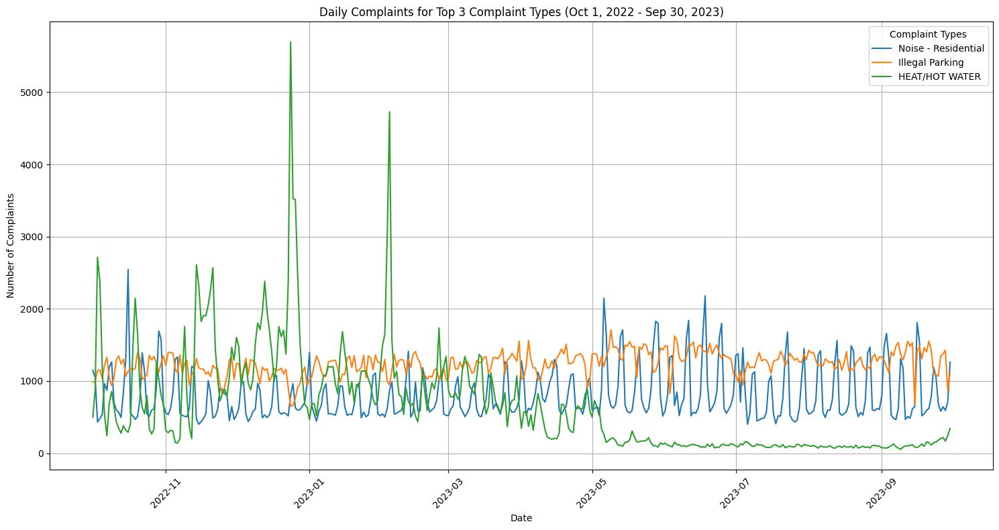

In [35]:
visualization1_dataframe = get_data_for_visual_1()
plot_visual_1(visualization1_dataframe)

In [36]:
def plot_visual_2(df):
    plt.figure(figsize=(15, 8))
    sns.barplot(data=df, x='complaint_type', y='complaint_count')
    plt.title('Top 10 Complaint Types in Zip Code 10027 (Oct 1, 2018 - Sep 30, 2023)')
    plt.xlabel('Complaint Type')
    plt.ylabel('Number of Complaints')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [37]:
def get_data_for_visual_2():
    # SQL query to fetch top 10 complaint types in zip code 10027
    query = """
    WITH TopComplaints AS (
        SELECT complaint_type, COUNT(*) AS count
        FROM nyc311_complaints
        WHERE zipcode = 10027 AND date BETWEEN '2018-10-01' AND '2023-09-30'
        GROUP BY complaint_type
        ORDER BY count DESC
        LIMIT 10
    )
    SELECT nyc311_complaints.complaint_type, COUNT(*) AS complaint_count
    FROM TopComplaints
    JOIN nyc311_complaints ON TopComplaints.complaint_type = nyc311_complaints.complaint_type
    WHERE nyc311_complaints.zipcode = 10027 AND nyc311_complaints.date BETWEEN '2018-10-01' AND '2023-09-30'
    GROUP BY nyc311_complaints.complaint_type
    ORDER BY complaint_count DESC;
    """

    # Execute the query and return a DataFrame
    df = pd.read_sql_query(query, engine)
    return df

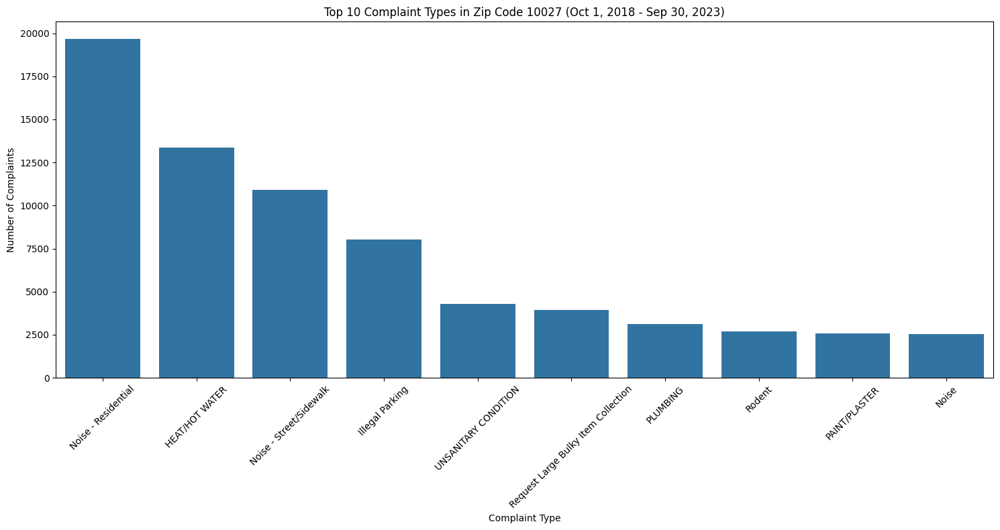

In [38]:
visualization2_dataframe = get_data_for_visual_2()
plot_visual_2(visualization2_dataframe)

In [39]:
# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()

In [40]:
def get_data_for_visual_3():
    # Query your database for the data needed.
    query="""
WITH RentData AS (
        SELECT zipcode, AVG(rent) AS average_rent
        FROM rents
        WHERE date BETWEEN '2015-01-01' AND '2023-09-30'
        GROUP BY zipcode
    ),
    TreeData AS (
        SELECT zipcode, COUNT(*) AS tree_count
        FROM trees
        GROUP BY zipcode
    ),
    ComplaintData AS (
        SELECT zipcode, COUNT(*) AS complaint_count
        FROM nyc311_complaints
        WHERE date BETWEEN '2015-01-01' AND '2023-09-30'
        GROUP BY zipcode
    )
    SELECT r.zipcode, r.average_rent, t.tree_count, c.complaint_count
    FROM RentData r
    LEFT JOIN TreeData t ON r.zipcode = t.zipcode
    LEFT JOIN ComplaintData c ON r.zipcode = c.zipcode;
    """

    df = pd.read_sql_query(query, engine)
    return df

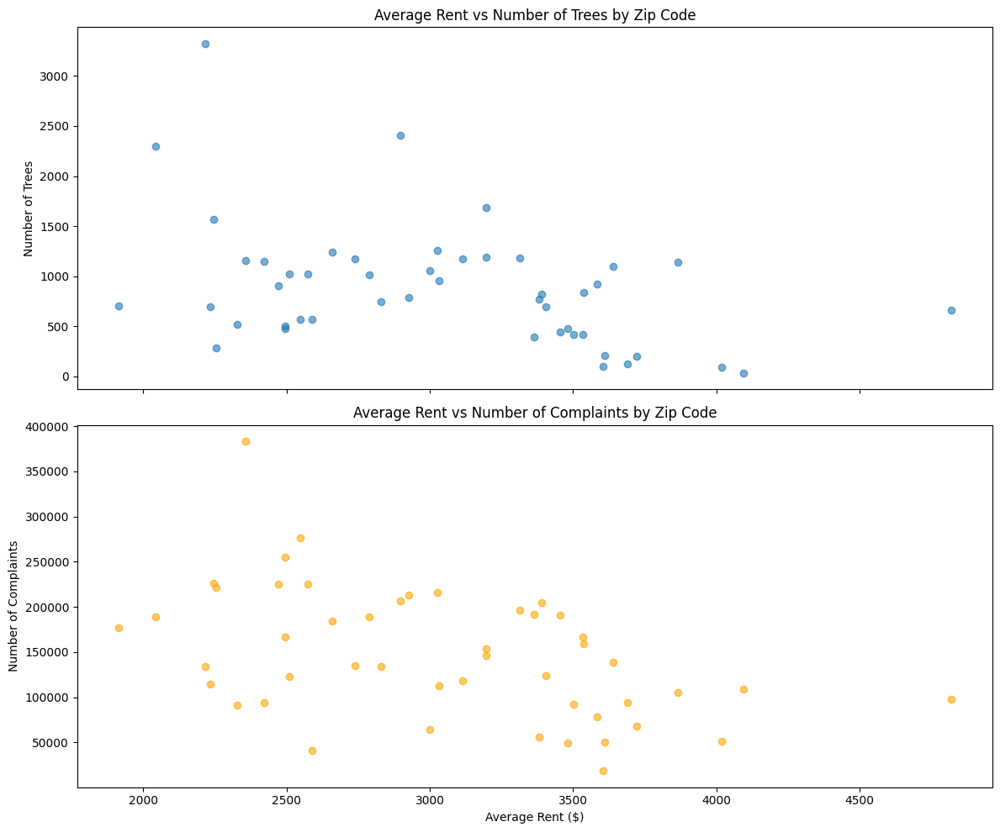

In [41]:
visualization3_dataframe = get_data_for_visual_3()
plot_visual_3(visualization3_dataframe)

In [42]:
def plot_visual_4(df):
    # Create the boxplot
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='rent_bin', y='complaint_count', data=df)
    
    # Customize the plot
    plt.title('Boxplot of 311 Complaints by Rent Bins (Sep 2023)')
    plt.xlabel('Average Rent Bins ($1000 increments)')
    plt.ylabel('Number of 311 Complaints')

    # Show the plot
    plt.show()

In [43]:
def get_data_for_visual_4():
    # Define SQL query to fetch required data
    query = """
    WITH RentBins AS (
        SELECT zipcode, 
               AVG(rent) AS average_rent,
               WIDTH_BUCKET(AVG(rent), 0, 10000, 10) AS rent_bin
        FROM rents
        WHERE date BETWEEN '2023-09-01' AND '2023-09-30'
        GROUP BY zipcode
    ),
    ComplaintsCount AS (
        SELECT zipcode, 
               COUNT(*) AS complaint_count
        FROM nyc311_complaints
        WHERE date BETWEEN '2022-10-01' AND '2023-09-30'
        GROUP BY zipcode
    )
    SELECT R.zipcode, 
           R.rent_bin, 
           R.average_rent, 
           C.complaint_count
    FROM RentBins R
    JOIN ComplaintsCount C ON R.zipcode = C.zipcode
    ORDER BY R.rent_bin;
    """

    # Execute the query and return a DataFrame
    df = pd.read_sql_query(query, engine)
    return df

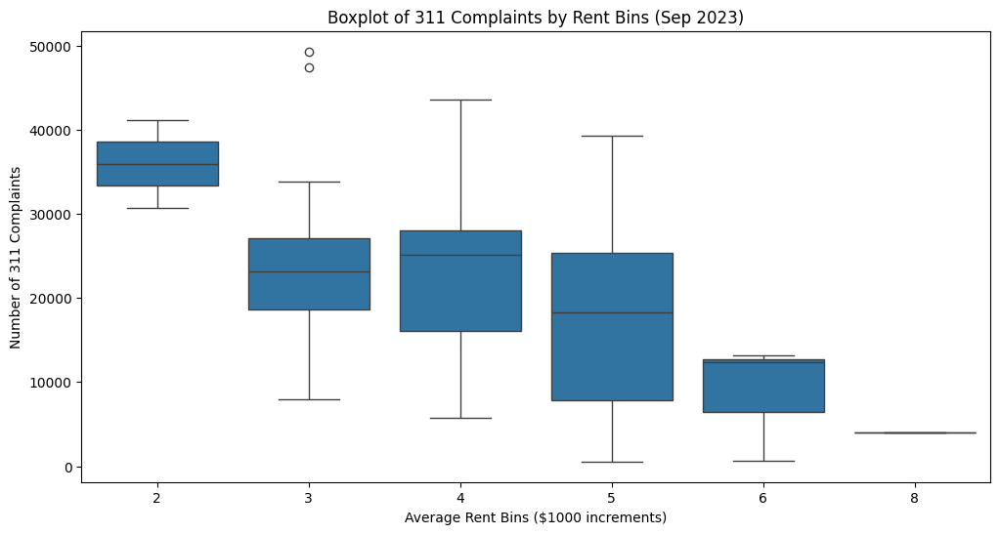

In [44]:
visualization4_dataframe = get_data_for_visual_4()
plot_visual_4(visualization4_dataframe)

In [45]:
def plot_visual_5(df):
    # Create a geospatial map
    fig, ax = plt.subplots(figsize=(10, 6))
    df.plot(ax=ax, marker='o', color='blue', markersize=5)
    
    # Center point (for visualization center)
    center_point = Point(-73.96253174434912, 40.80737875669467)
    plt.scatter([center_point.x], [center_point.y], color='red')  # 红点代表中心点

    # Set the chart title and label
    plt.title('Recent 311 Incidents in the Immediate Area (Jan 1, 2023 - Sep 30, 2023)')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Show charts
    plt.show()

In [46]:
def get_data_for_visual_5():
    query = """
    SELECT latitude, longitude
FROM nyc311_complaints
WHERE ST_DWithin(
    geography(ST_MakePoint(longitude, latitude)),
    geography(ST_MakePoint(-73.96253174434912, 40.80737875669467)), 
    1000 -- distance in meters
)
AND date BETWEEN '2023-01-01' AND '2023-09-30';

    """
    
    df_query_result = pd.read_sql_query(query, engine)
    df = gpd.GeoDataFrame(
        df_query_result,
        geometry=gpd.points_from_xy(df_query_result.longitude, df_query_result.latitude)
    )
    return df

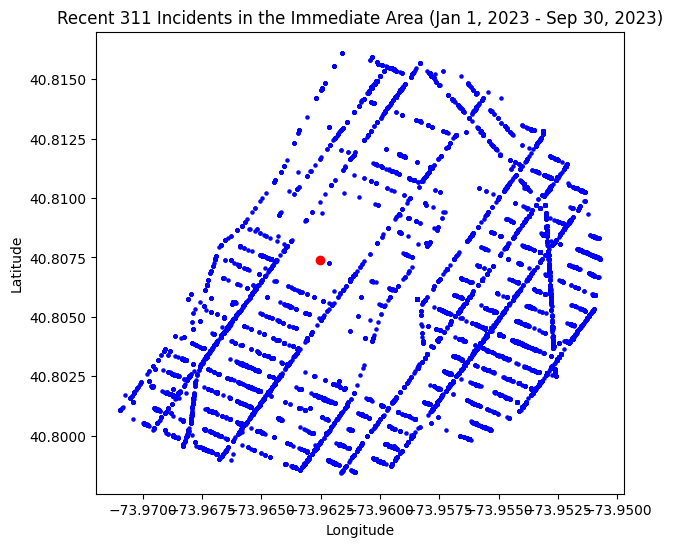

In [47]:
visualization5_dataframe = get_data_for_visual_5()
plot_visual_5(visualization5_dataframe)

In [48]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [49]:
def plot_visual_6(df_trees, df_new_tree_requests):
    # Create a geospatial chart
    fig, ax = plt.subplots(figsize=(10, 10))

    #Draw the new tree request location on the map
    df_new_tree_requests.plot(ax=ax, markersize=5, color='red', label='New Tree Requests')
    
    # Plot the tree position on the map
    df_trees.plot(ax=ax, markersize=5, color='green', label='Trees')

    # Customize the chart
    plt.title('Trees and New Tree Requests in NYC')
    plt.legend()

    # show chart
    plt.show()

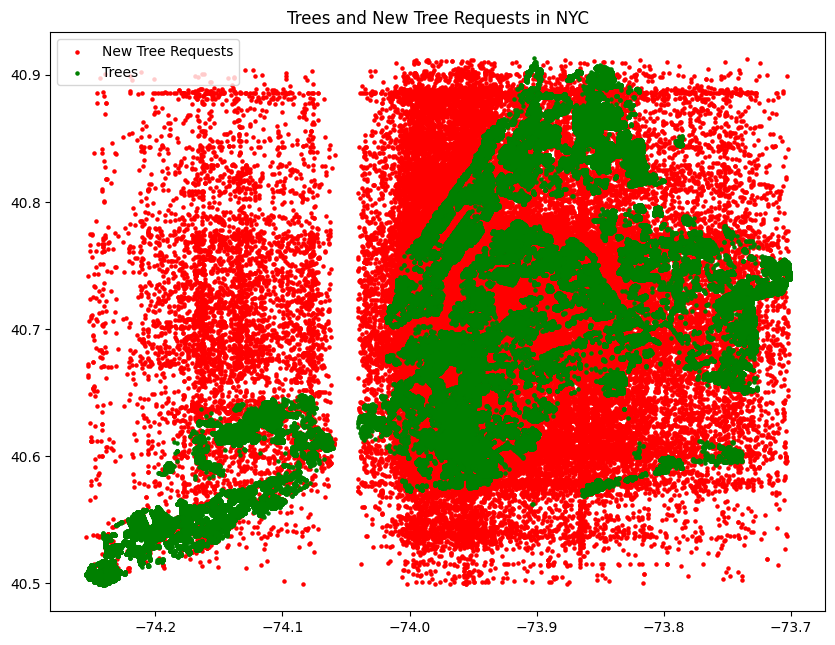

In [50]:
df_trees, df_new_tree_requests = get_data_for_visual_6()
plot_visual_6(df_trees, df_new_tree_requests)

IndentationError: expected an indented block (760631962.py, line 19)

In [55]:
def plot_visual_5(df):
    # Create a geospatial map
    fig, ax = plt.subplots(figsize=(10, 6))
    df.plot(ax=ax, marker='o', color='blue', markersize=5)
    
    # Center point (for visualization center)
    center_point = Point(-73.96253174434912, 40.80737875669467)
    plt.scatter([center_point.x], [center_point.y], color='red')  # 红点代表中心点

    # Set the chart title and label
    plt.title('Recent 311 Incidents in the Immediate Area (Jan 1, 2023 - Sep 30, 2023)')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Show charts
    plt.show()

In [56]:
def plot_visual_5(df):
    # Create a geospatial map
    fig, ax = plt.subplots(figsize=(10, 6))
    df.plot(ax=ax, marker='o', color='blue', markersize=5)
    
    # Center point (for visualization center)
    center_point = Point(-73.96253174434912, 40.80737875669467)
    plt.scatter([center_point.x], [center_point.y], color='red')  # 红点代表中心点

    # Set the chart title and label
    plt.title('Recent 311 Incidents in the Immediate Area (Jan 1, 2023 - Sep 30, 2023)')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Show charts
    plt.show()

In [57]:
def plot_visual_5(df):
    # Create a geospatial map
    fig, ax = plt.subplots(figsize=(10, 6))
    df.plot(ax=ax, marker='o', color='blue', markersize=5)
    
    # Center point (for visualization center)
    center_point = Point(-73.96253174434912, 40.80737875669467)
    plt.scatter([center_point.x], [center_point.y], color='red')  # 红点代表中心点

    # Set the chart title and label
    plt.title('Recent 311 Incidents in the Immediate Area (Jan 1, 2023 - Sep 30, 2023)')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Show charts
    plt.show()

IndentationError: expected an indented block (522113070.py, line 19)

In [59]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [60]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [61]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [62]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [63]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [64]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [65]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [66]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [67]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [68]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [69]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [70]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [71]:
def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests

def get_data_for_visual_6():
    query_trees = """
    SELECT latitude, longitude
    FROM trees;
    """

    query_new_tree_requests = """
    SELECT latitude, longitude
    FROM nyc311_complaints
    WHERE complaint_type = 'New Tree Request'
    AND date BETWEEN '2018-10-01' AND '2023-09-30';
    """

    df_trees = gpd.GeoDataFrame(
        pd.read_sql_query(query_trees, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_trees, engine).longitude, pd.read_sql_query(query_trees, engine).latitude)
    )
    df_new_tree_requests = gpd.GeoDataFrame(
        pd.read_sql_query(query_new_tree_requests, engine),
        geometry=gpd.points_from_xy(pd.read_sql_query(query_new_tree_requests, engine).longitude, pd.read_sql_query(query_new_tree_requests, engine).latitude)
    )

    return df_trees, df_new_tree_requests



In [79]:
# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()

In [80]:
# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()

In [81]:
# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()# use a more descriptive name for your function
def plot_visual_3(df):
    # Create a subgraph
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

    # Subgraph of rent versus number of trees
    ax1.scatter(df['average_rent'], df['tree_count'], alpha=0.6)
    ax1.set_ylabel('Number of Trees')
    ax1.set_title('Average Rent vs Number of Trees by Zip Code')

    # Subgraph of rent versus number of complaints
    ax2.scatter(df['average_rent'], df['complaint_count'], alpha=0.6, color='orange')
    ax2.set_xlabel('Average Rent ($)')
    ax2.set_ylabel('Number of Complaints')
    ax2.set_title('Average Rent vs Number of Complaints by Zip Code')

    # show chart
    plt.tight_layout()
    plt.show()